# 라이브러리 불러오기

In [1]:
import pandas as pd
import numpy as np
import random 
import os
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import duckdb
from pathlib import Path
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import permutations

#한글 깨짐 방지
plt.rc('font', family='Malgun Gothic') 
plt.rcParams['axes.unicode_minus'] = False

import warnings
warnings.filterwarnings('ignore')

In [2]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

# 데이터 불러오기

In [3]:
data_path = Path('../data')

train = pd.read_csv(data_path / 'train.csv')
test = pd.read_csv(data_path / 'test.csv')
train_target = train['support_needs']

#데이터 구조 확인
train.head()



,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction,support_needs
0,TRAIN_00000,54.0,F,47.0,22.0,8.0,member,90,25.0,0
1,TRAIN_00001,30.0,M,16.0,15.0,5.0,vip,360,23.0,0
2,TRAIN_00002,29.0,M,8.0,30.0,21.0,plus,30,21.0,0
3,TRAIN_00003,38.0,F,38.0,23.0,10.0,vip,90,6.0,0
4,TRAIN_00004,25.0,F,52.0,3.0,17.0,member,30,1.0,2


In [4]:
#EDA
train.describe()
train_cols = [col for col in train.columns if 'ID' not in col]

print(train_cols)

['age', 'gender', 'tenure', 'frequent', 'payment_interval', 'subscription_type', 'contract_length', 'after_interaction', 'support_needs']


# EDA

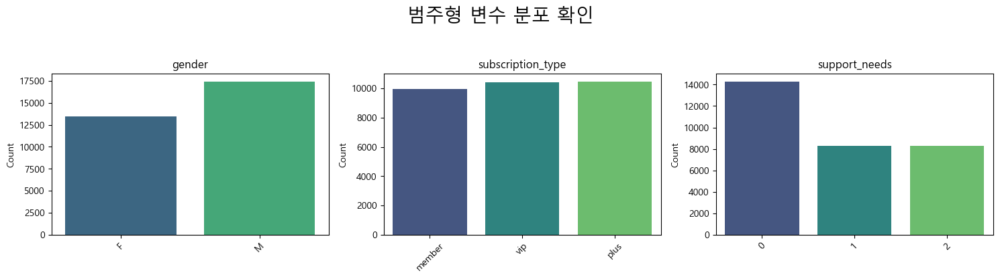

In [5]:
#범주형 변수 리스트
categorical_vars = [
    'gender', 'subscription_type', 'support_needs'
]

#그래프 그리기기
plt.figure(figsize=(15, 10))
plt.suptitle('범주형 변수 분포 확인', fontsize=20)

# 반복문을 통해 각 변수별로 그래프 그리기
for i, var in enumerate(categorical_vars, 1):
    plt.subplot(3, 3, i) # 3x3 격자에 i번째 그래프를 그림
    sns.countplot(x=var, data=train, palette='viridis')
    plt.title(var)
    plt.xlabel('')
    plt.ylabel('Count')
    plt.xticks(rotation=45)

plt.tight_layout(rect=[0, 0, 1, 0.96])

# support_needs 변수가 불균형하다, 어떻게 해결해야 하지?

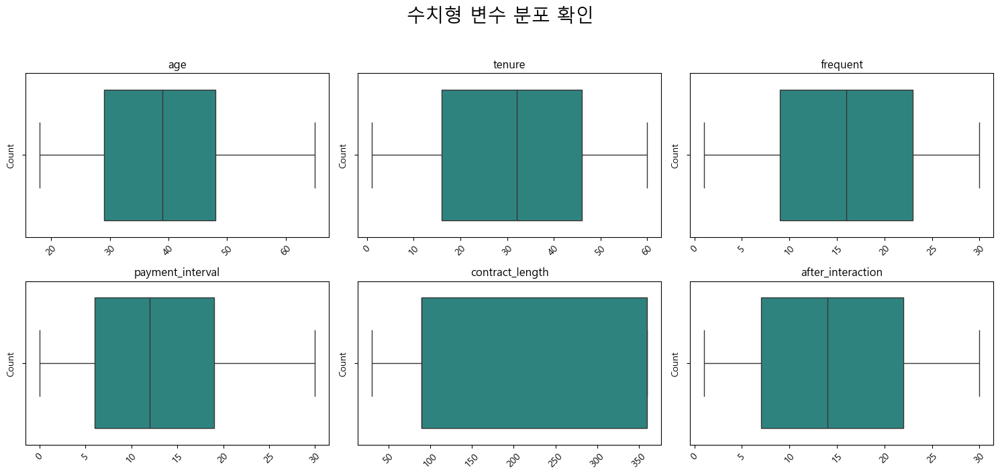

In [6]:
# 수치형 변수 리스트
numerical_vars = ['age', 'tenure', 'frequent', 'payment_interval', 'contract_length', 'after_interaction']

#그래프 그리기
plt.figure(figsize=(15, 10))
plt.suptitle('수치형 변수 분포 확인', fontsize=20)

# 반복문을 통해 각 변수별로 그래프 그리기
for i, var in enumerate(numerical_vars , 1):
    plt.subplot(3, 3, i) # 3x3 격자에 i번째 그래프를 그림
    sns.boxplot(x=var, data=train, palette='viridis')
    plt.title(var)
    plt.xlabel('')
    plt.ylabel('Count')
    plt.xticks(rotation=45)

plt.tight_layout(rect=[0, 0, 1, 0.96])

# 얼추 다 괜찮게 생긴거같다

In [7]:
# 연속형 - 연속형 상관계수 (피어슨 상관계수)
# 1. 각 변수가 연속형이어야함
# 2. 각 변수가 정규분포여야함
# 정규성 검정 샤피로 - 윌크 검정
import pingouin as pg
for i in numerical_vars:
    print(pg.normality(train[i]))


            W          pval  normal
age  0.973539  7.311240e-58   False
               W          pval  normal
tenure  0.953519  3.533886e-69   False
                 W          pval  normal
frequent  0.954784  1.338857e-68   False
                         W          pval  normal
payment_interval  0.962587  1.071823e-64   False
                        W           pval  normal
contract_length  0.710029  4.047622e-113   False
                         W          pval  normal
after_interaction  0.95252  1.261306e-69   False


# 어짜피 XGB 쓸거라 상관없음

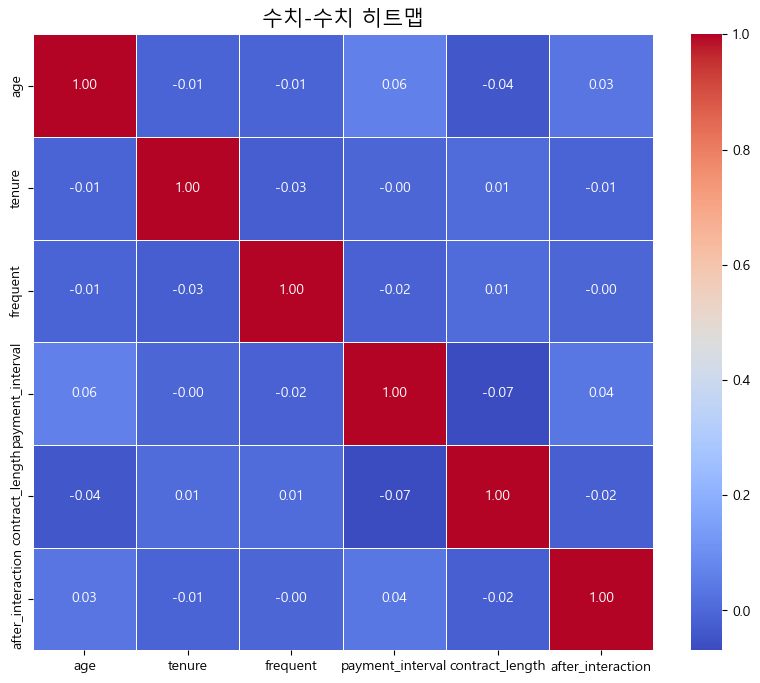

In [8]:
# 수치형 변수들 히트맵 그리기
corr_matrix_numerical = train[numerical_vars].corr()

# 2. 히트맵 그리기
plt.figure(figsize=(10, 8)) # 그래프 크기 설정
sns.heatmap(
    corr_matrix_numerical,
    annot=True,      # 각 셀에 값(상관계수) 표시
    cmap='coolwarm', # 색상 스타일 지정 (양수는 붉은색, 음수는 푸른색)
    fmt='.2f',       # 소수점 둘째 자리까지 표시
    linewidths=.5    # 셀 사이의 경계선 두께
)
plt.title('수치-수치 히트맵', fontsize=15)
plt.show()

# 수치형끼리는 전부 다 독립으로 보임

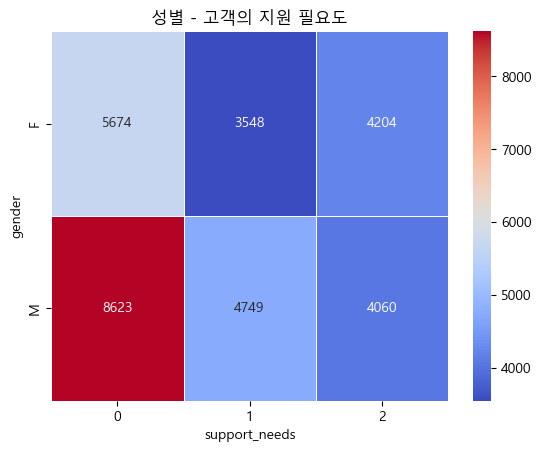

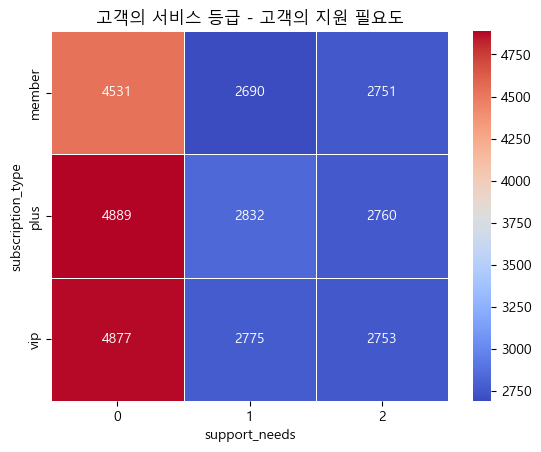

In [9]:
# 범주형 - 범주형 상관계수

# 성별 - 고객의 지원 필요도
cross_table = pd.crosstab(train['gender'],train['support_needs'])
sns.heatmap(cross_table, annot=True, cmap ='coolwarm',fmt='d',linewidths=.5 )
plt.title('성별 - 고객의 지원 필요도')
plt.show()

# 고객의 서비스 등급 - 고객의 지원 필요도
cross_table = pd.crosstab(train['subscription_type'],train['support_needs'])
sns.heatmap(cross_table, annot=True, cmap ='coolwarm',fmt='d',linewidths=.5  )
plt.title('고객의 서비스 등급 - 고객의 지원 필요도')
plt.show()

# support_needs 에 0이 많아서 그래보이는 듯?

In [10]:
print(train['support_needs'].value_counts())

support_needs
0    14297
1     8297
2     8264
Name: count, dtype: int64


# 맞네요

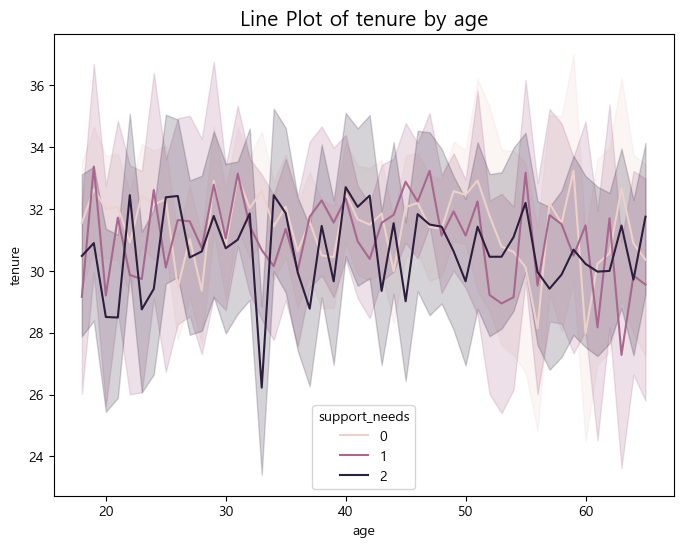

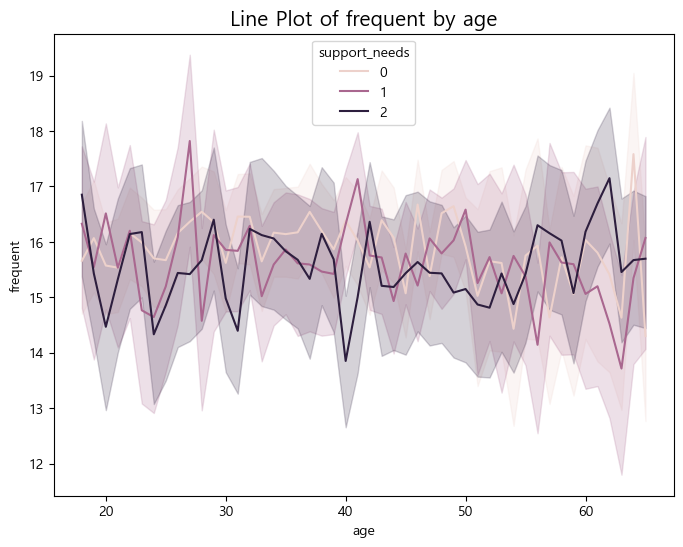

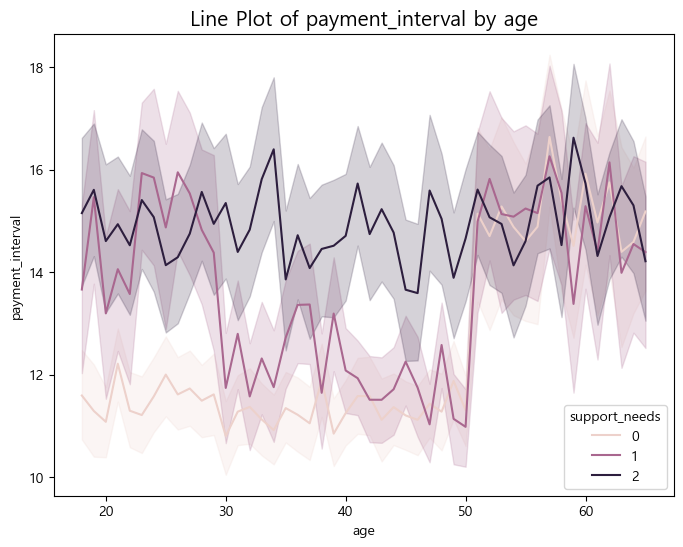

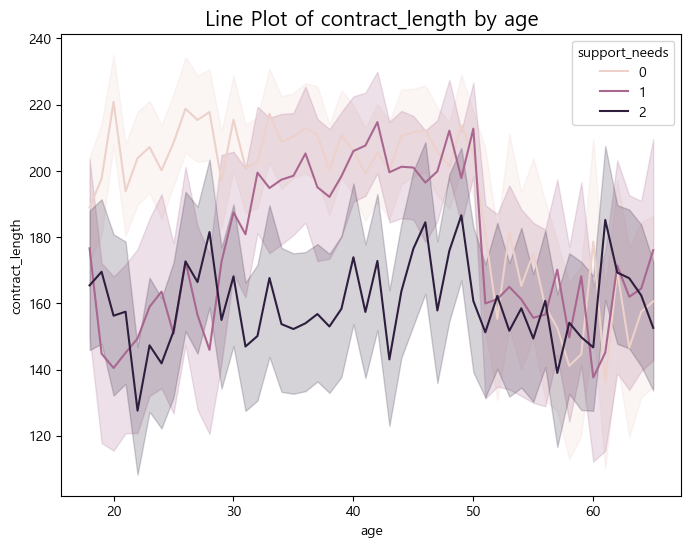

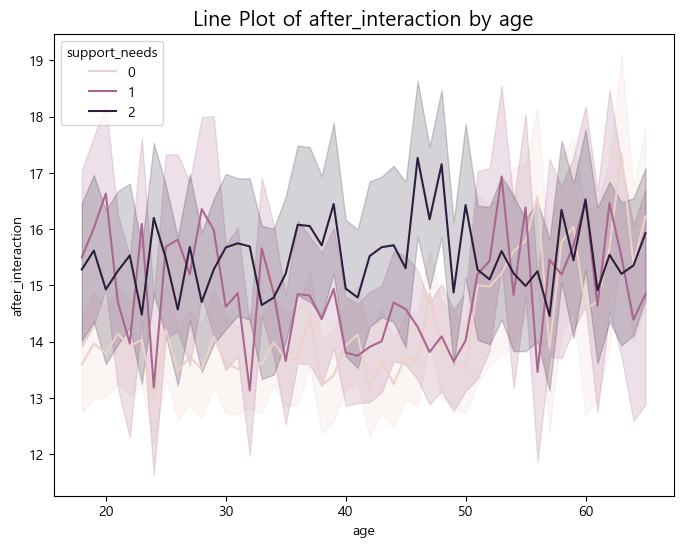

...

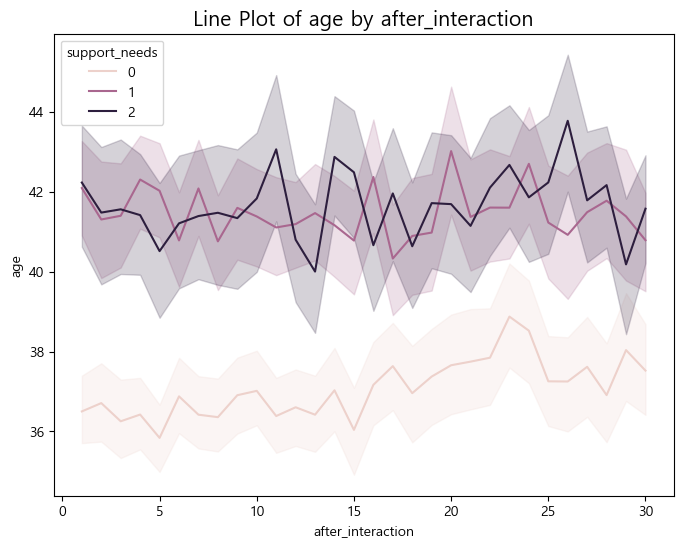

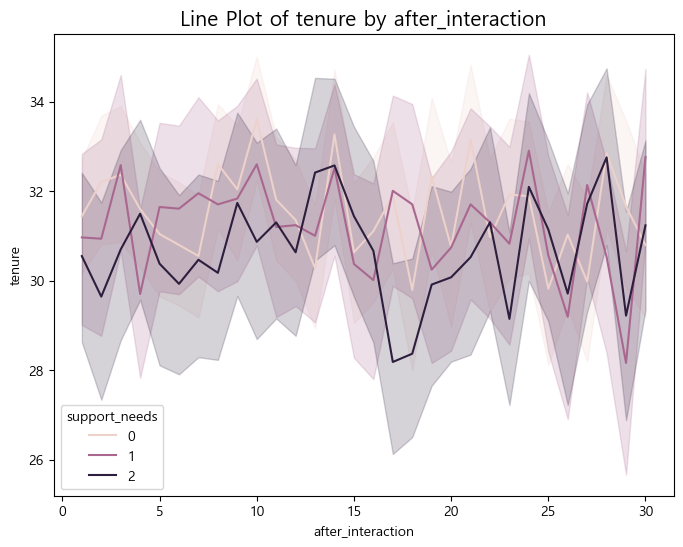

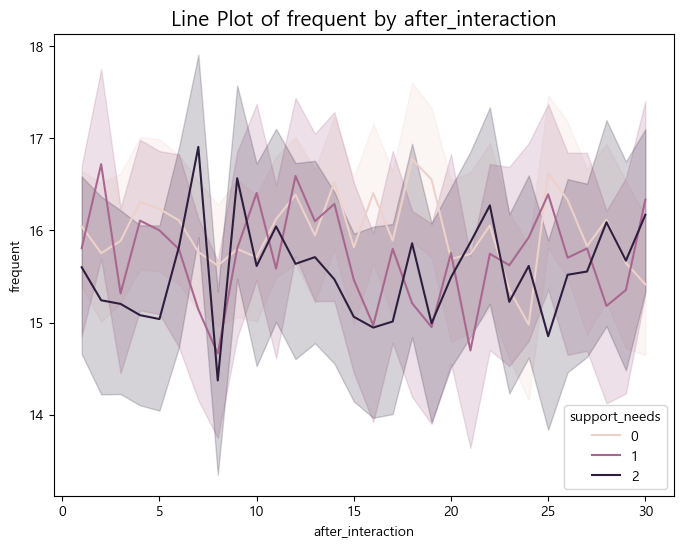

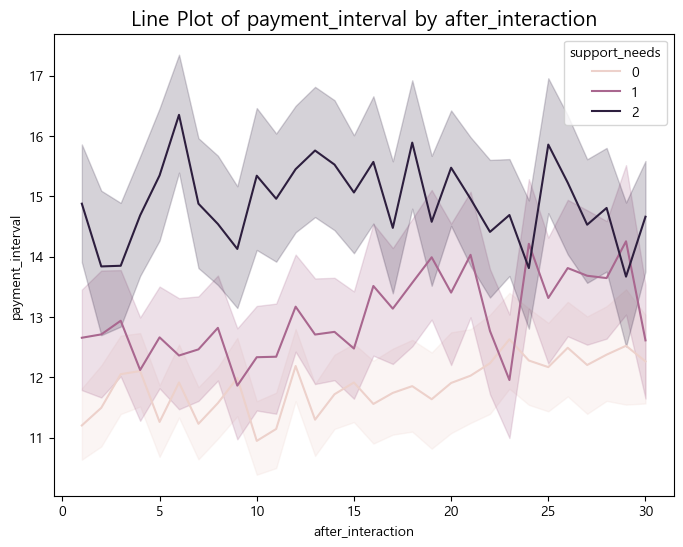

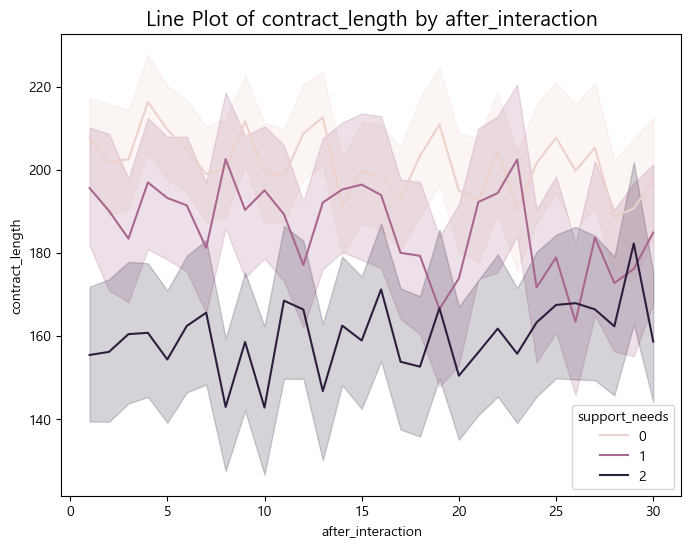

In [11]:
# 고객지원등급 별로 차이가 있나?
from itertools import permutations

var_combinations = permutations(numerical_vars, 2)

for x_var, y_var in var_combinations:
    plt.figure(figsize=(8, 6)) # 각 그래프를 새로운 창에 그리기 위해 figure 생성
    
    sns.lineplot(
        x=x_var,
        y=y_var,
        hue='support_needs',
        data=train
    )
    
    plt.title(f'Line Plot of {y_var} by {x_var}', fontsize=15)
    plt.show()


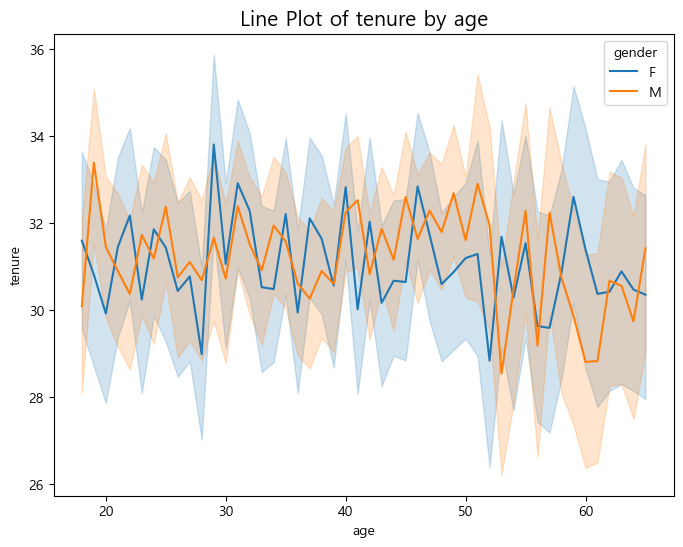

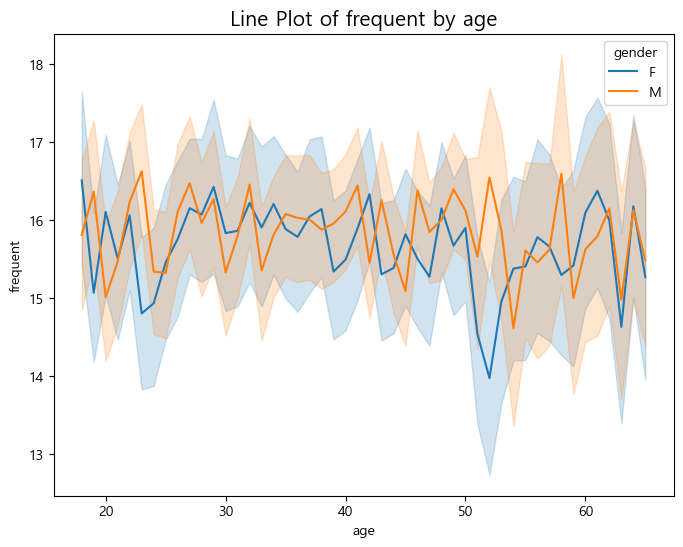

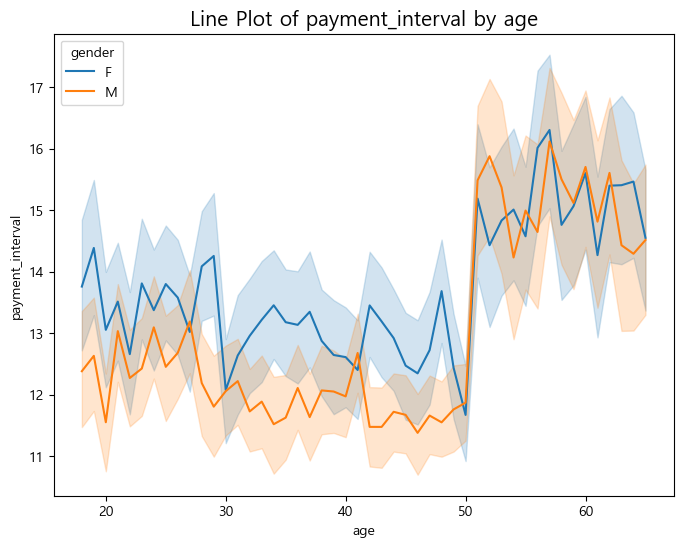

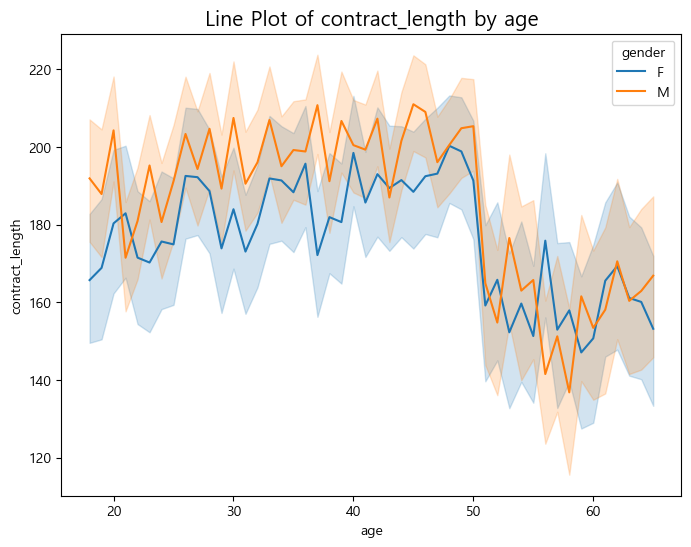

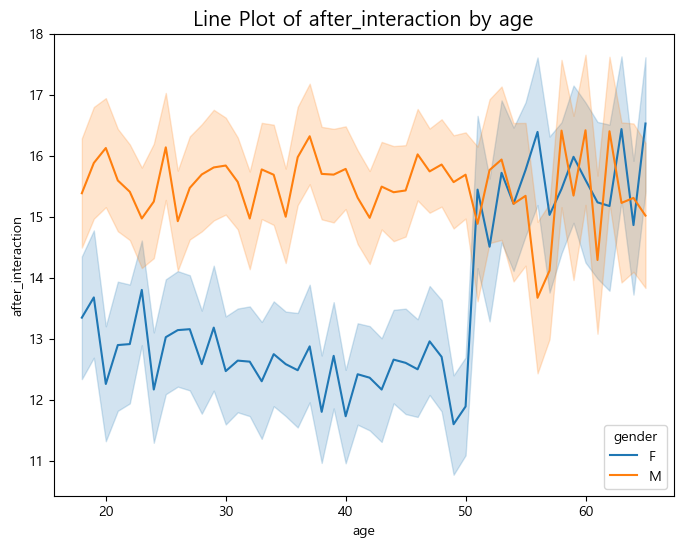

...

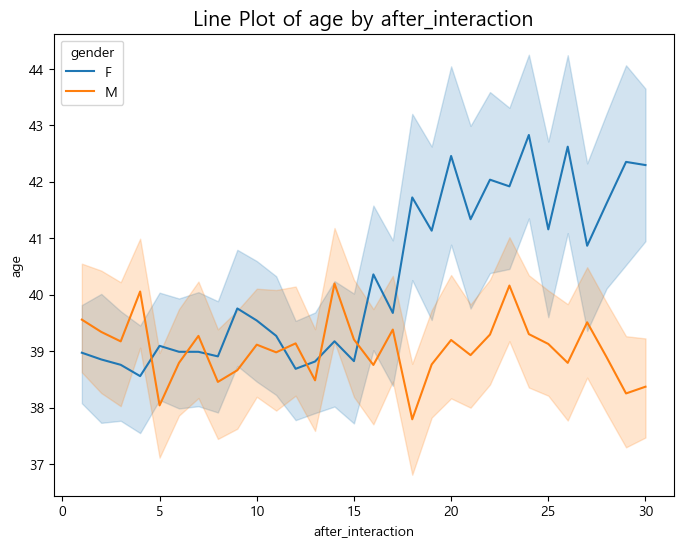

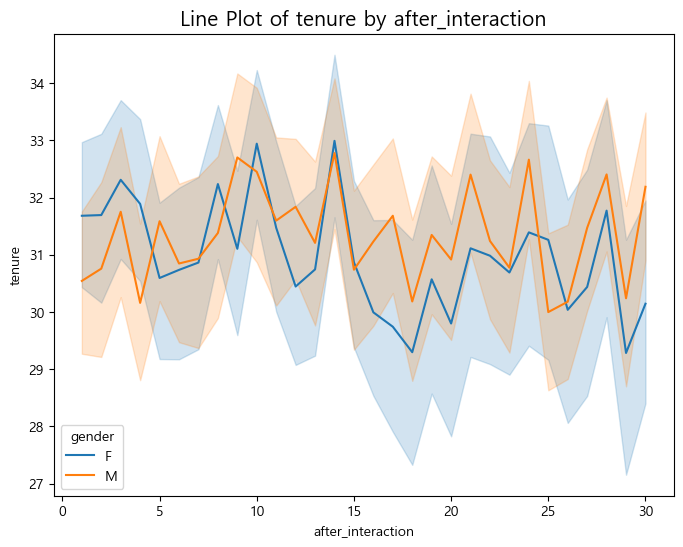

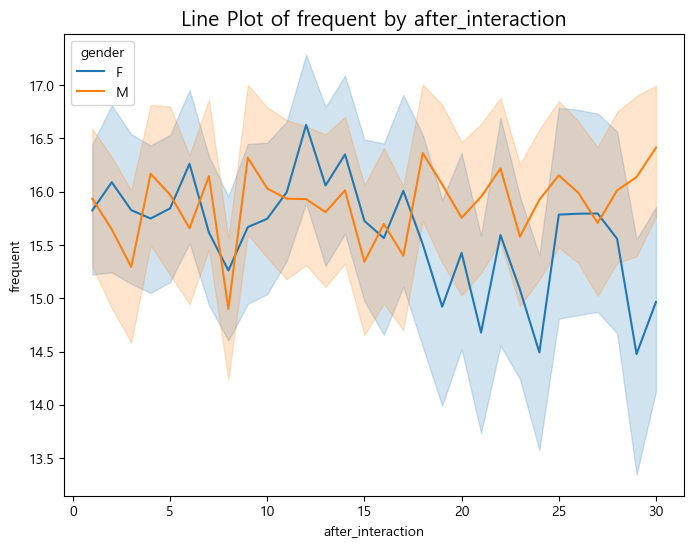

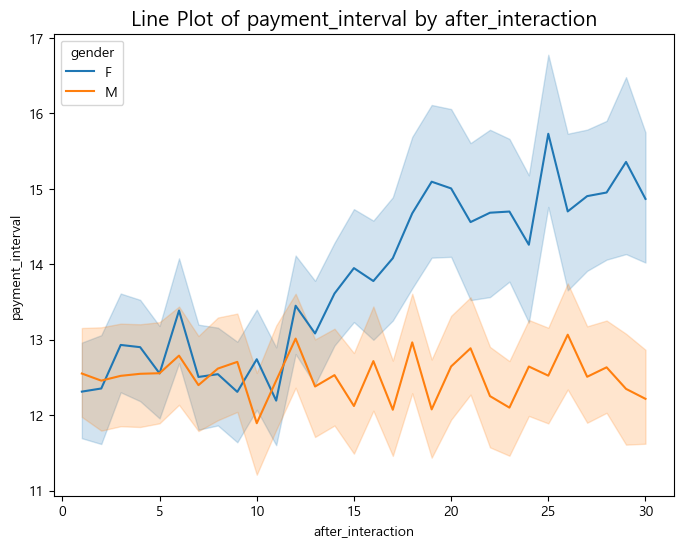

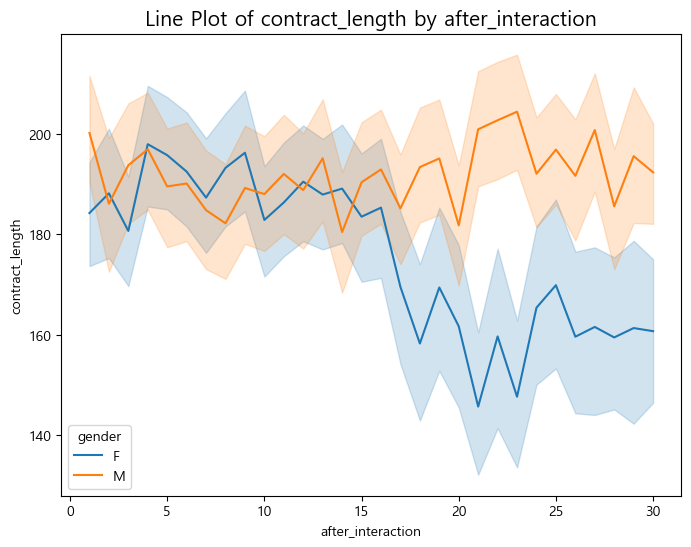

In [12]:
# 성별별로 차이가 있나?
from itertools import permutations

var_combinations = permutations(numerical_vars, 2)

for x_var, y_var in var_combinations:
    plt.figure(figsize=(8, 6)) # 각 그래프를 새로운 창에 그리기 위해 figure 생성
    
    sns.lineplot(
        x=x_var,
        y=y_var,
        hue='gender',
        data=train
    )
    
    plt.title(f'Line Plot of {y_var} by {x_var}', fontsize=15)
    plt.show()


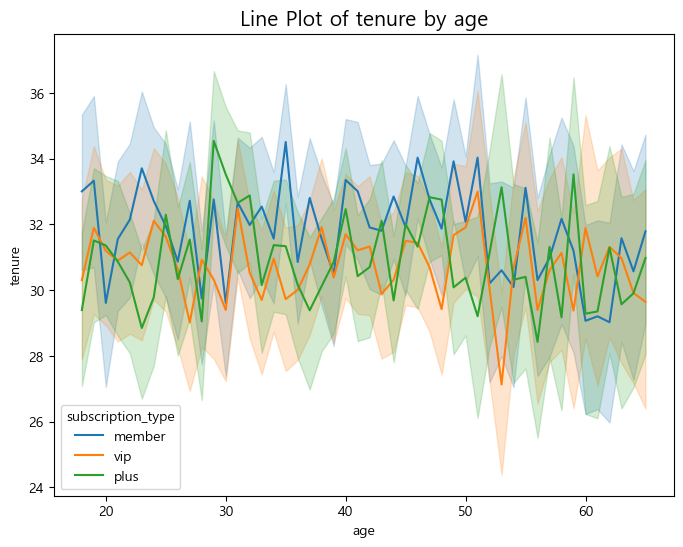

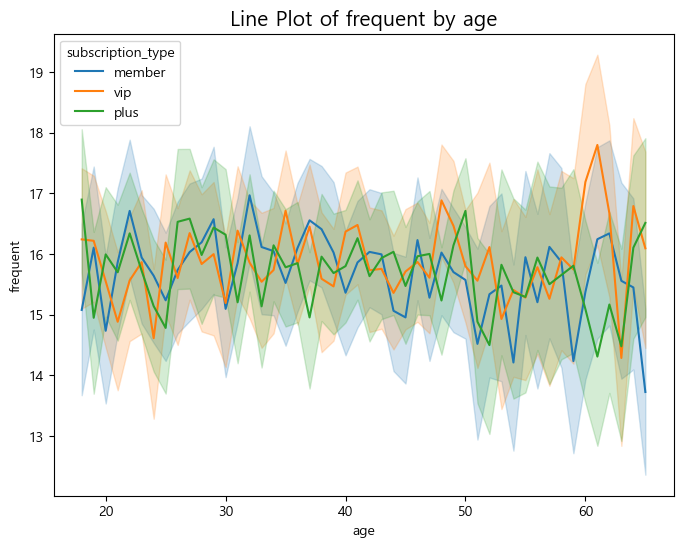

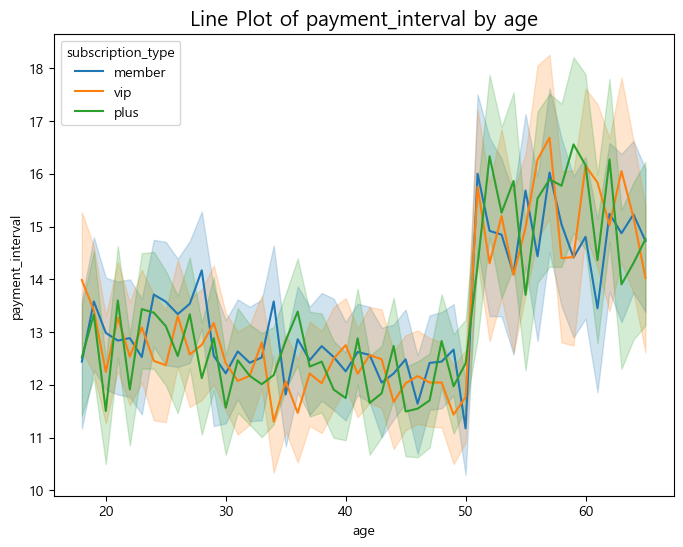

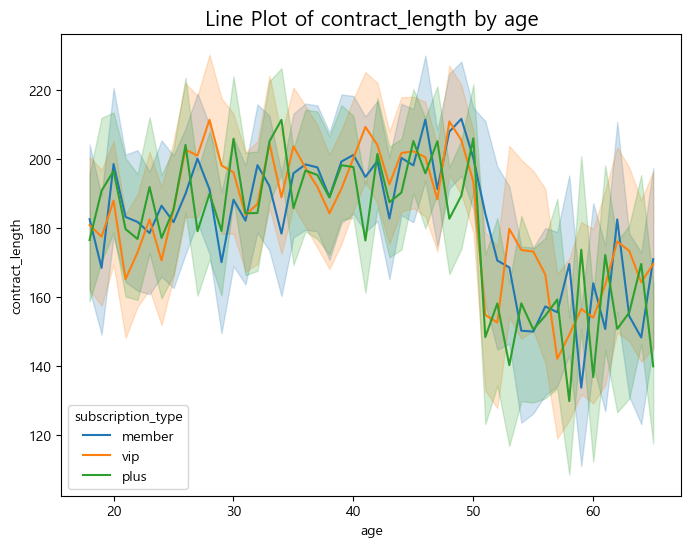

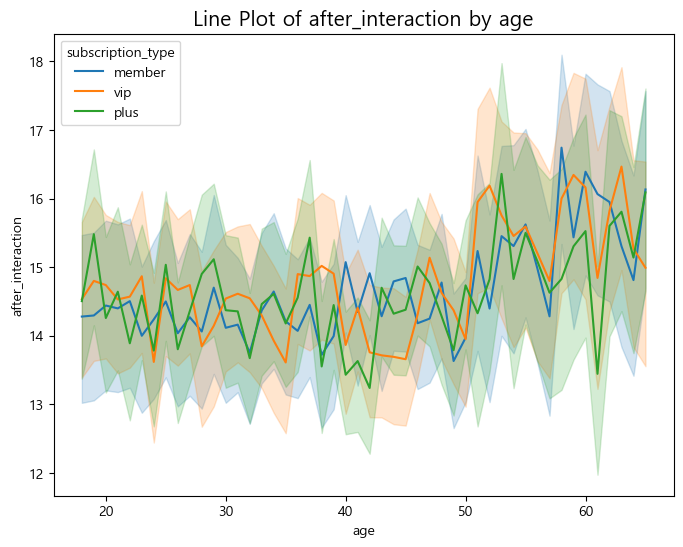

...

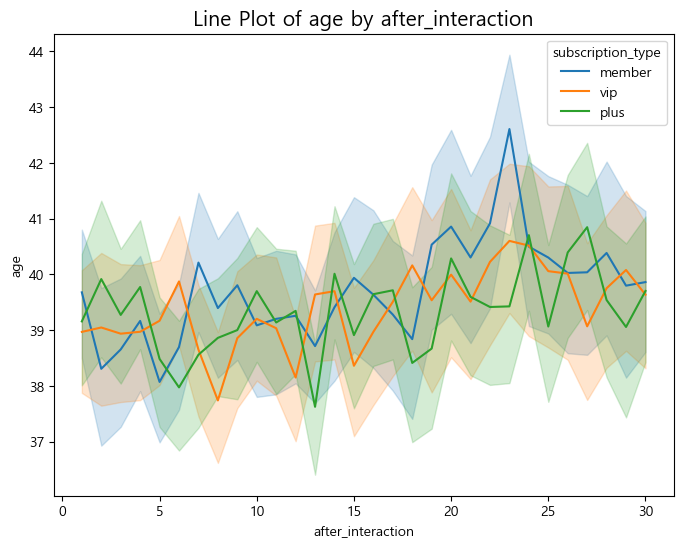

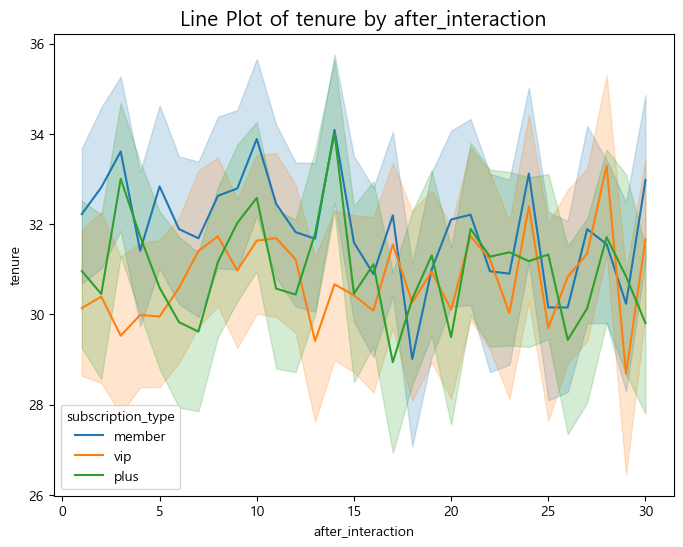

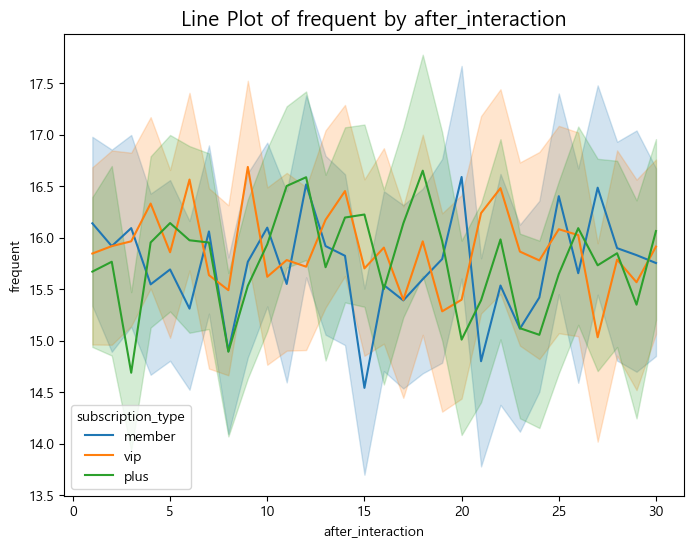

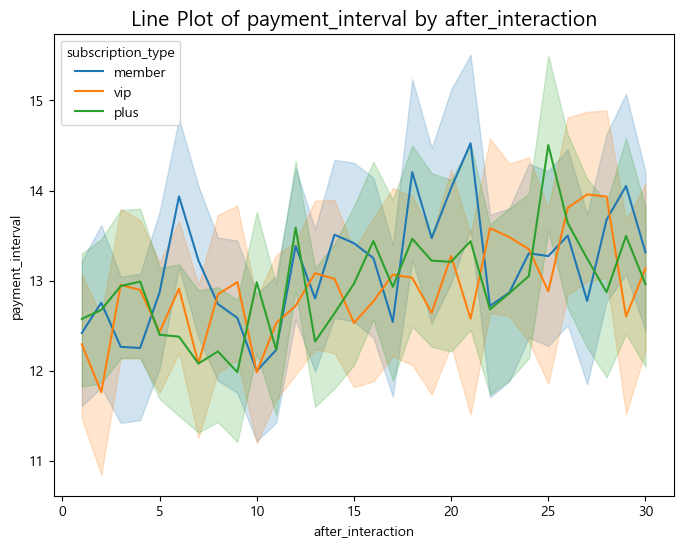

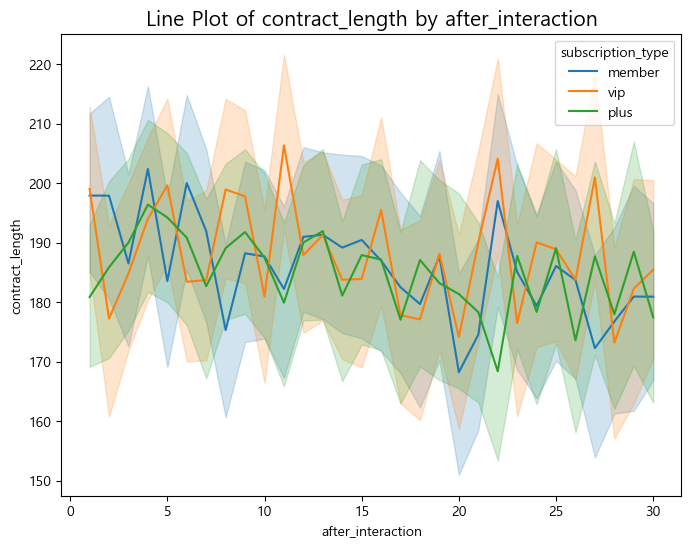

In [13]:
# 고객등급별로 차이가 있나요?
from itertools import permutations

var_combinations = permutations(numerical_vars, 2)

for x_var, y_var in var_combinations:
    plt.figure(figsize=(8, 6)) # 각 그래프를 새로운 창에 그리기 위해 figure 생성
    
    sns.lineplot(
        x=x_var,
        y=y_var,
        hue='subscription_type',
        data=train
    )
    
    plt.title(f'Line Plot of {y_var} by {x_var}', fontsize=15)
    plt.show()


# Polyserial correlation

# 피처 엔지니어링

In [14]:
train.head()

,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction,support_needs
0,TRAIN_00000,54.0,F,47.0,22.0,8.0,member,90,25.0,0
1,TRAIN_00001,30.0,M,16.0,15.0,5.0,vip,360,23.0,0
2,TRAIN_00002,29.0,M,8.0,30.0,21.0,plus,30,21.0,0
3,TRAIN_00003,38.0,F,38.0,23.0,10.0,vip,90,6.0,0
4,TRAIN_00004,25.0,F,52.0,3.0,17.0,member,30,1.0,2


In [15]:
test.head()

,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction
0,TEST_00000,18.0,M,40.0,6.0,15.0,member,30,18.0
1,TEST_00001,40.0,M,41.0,23.0,0.0,member,90,16.0
2,TEST_00002,59.0,F,30.0,1.0,21.0,member,360,25.0
3,TEST_00003,38.0,M,2.0,10.0,0.0,member,30,18.0
4,TEST_00004,30.0,M,28.0,21.0,20.0,member,360,28.0


In [16]:
#범주형 변수 인코딩
train['gender'] =train['gender'].map({'F':0, "M": 1})
test ['gender'] = test['gender'].map({'F':0, "M": 1})

train['subscription_type'] =train['subscription_type'].map({'member' : 0, 'plus' : 1, 'vip' : 2})
test['subscription_type'] =test['subscription_type'].map({'member' : 0, 'plus' : 1, 'vip' : 2})


In [105]:
train.head()

,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction,support_needs
0,TRAIN_00000,54.0,0,47.0,22.0,8.0,0,90,25.0,0
1,TRAIN_00001,30.0,1,16.0,15.0,5.0,2,360,23.0,0
2,TRAIN_00002,29.0,1,8.0,30.0,21.0,1,30,21.0,0
3,TRAIN_00003,38.0,0,38.0,23.0,10.0,2,90,6.0,0
4,TRAIN_00004,25.0,0,52.0,3.0,17.0,0,30,1.0,2


In [106]:
test.head()

,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction
0,TEST_00000,18.0,1,40.0,6.0,15.0,0,30,18.0
1,TEST_00001,40.0,1,41.0,23.0,0.0,0,90,16.0
2,TEST_00002,59.0,0,30.0,1.0,21.0,0,360,25.0
3,TEST_00003,38.0,1,2.0,10.0,0.0,0,30,18.0
4,TEST_00004,30.0,1,28.0,21.0,20.0,0,360,28.0


In [136]:
query = """
SELECT 
    age,
    gender ,
    contract_length ,
    contract_length*subscription_type as subscription_value,
    subscription_type*payment_interval as customer_lifetime_value,
    tenure / age AS membership_duration_ratio ,
    after_interaction / (frequent+1) as interaction_rate,
    frequent*after_interaction as activity_intensity,
    tenure/contract_length as tenure_contract_ratio,
    age*tenure as age_tenure_interaction,
    payment_interval * frequent as payment_frequent_interaction,
    payment_interval * (tenure+1) as payment_tenure_ratio,
    after_interaction * payment_interval as after_payment_interaction,
    support_needs
FROM train;
"""

train_fe = duckdb.query(query).to_df()
train_fe.head()

,age,gender,contract_length,subscription_value,customer_lifetime_value,membership_duration_ratio,interaction_rate,activity_intensity,tenure_contract_ratio,age_tenure_interaction,payment_frequent_interaction,payment_tenure_ratio,after_payment_interaction,support_needs
0,54.0,0,90,0,0.0,0.870370,1.086957,550.0,0.522222,2538.0,176.0,384.0,200.0,0
1,30.0,1,360,720,10.0,0.533333,1.437500,345.0,0.044444,480.0,75.0,85.0,115.0,0
2,29.0,1,30,30,21.0,0.275862,0.677419,630.0,0.266667,232.0,630.0,189.0,441.0,0
3,38.0,0,90,180,20.0,1.000000,0.250000,138.0,0.422222,1444.0,230.0,390.0,60.0,0
4,25.0,0,30,0,0.0,2.080000,0.250000,3.0,1.733333,1300.0,51.0,901.0,17.0,2


In [137]:
query = """
SELECT 
    age,
    gender ,
    contract_length ,
    contract_length*subscription_type as subscription_value,
    subscription_type*payment_interval as customer_lifetime_value,
    tenure / age AS membership_duration_ratio ,
    after_interaction / (frequent+1) as interaction_rate,
    frequent*after_interaction as activity_intensity,
    tenure/contract_length as tenure_contract_ratio,
    age*tenure as age_tenure_interaction,
    payment_interval * frequent as payment_frequent_interaction,
    payment_interval * (tenure+1) as payment_tenure_ratio,
    after_interaction * payment_interval as after_payment_interaction,
FROM test;
"""

test_fe = duckdb.query(query).to_df()
test_fe.head()

,age,gender,contract_length,subscription_value,customer_lifetime_value,membership_duration_ratio,interaction_rate,activity_intensity,tenure_contract_ratio,age_tenure_interaction,payment_frequent_interaction,payment_tenure_ratio,after_payment_interaction
0,18.0,1,30,0,0.0,2.222222,2.571429,108.0,1.333333,720.0,90.0,615.0,270.0
1,40.0,1,90,0,0.0,1.025000,0.666667,368.0,0.455556,1640.0,0.0,0.0,0.0
2,59.0,0,360,0,0.0,0.508475,12.500000,25.0,0.083333,1770.0,21.0,651.0,525.0
3,38.0,1,30,0,0.0,0.052632,1.636364,180.0,0.066667,76.0,0.0,0.0,0.0
4,30.0,1,360,0,0.0,0.933333,1.272727,588.0,0.077778,840.0,420.0,580.0,560.0


In [138]:
x_train = train_fe.drop(columns =['support_needs'])
x_test = test_fe
y_train = train_fe['support_needs']

In [139]:
x_train.head()

,age,gender,contract_length,subscription_value,customer_lifetime_value,membership_duration_ratio,interaction_rate,activity_intensity,tenure_contract_ratio,age_tenure_interaction,payment_frequent_interaction,payment_tenure_ratio,after_payment_interaction
0,54.0,0,90,0,0.0,0.870370,1.086957,550.0,0.522222,2538.0,176.0,384.0,200.0
1,30.0,1,360,720,10.0,0.533333,1.437500,345.0,0.044444,480.0,75.0,85.0,115.0
2,29.0,1,30,30,21.0,0.275862,0.677419,630.0,0.266667,232.0,630.0,189.0,441.0
3,38.0,0,90,180,20.0,1.000000,0.250000,138.0,0.422222,1444.0,230.0,390.0,60.0
4,25.0,0,30,0,0.0,2.080000,0.250000,3.0,1.733333,1300.0,51.0,901.0,17.0


In [140]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF 결과를 저장할 빈 데이터프레임 생성
vif = pd.DataFrame()

# x_train의 각 열에 대해 VIF 계수 계산
# range 범위를 data가 아닌 x_train의 열 개수로 지정하는 것이 더 안전합니다.
vif['VIF Factor'] = [variance_inflation_factor(x_train.values, i) for i in range(x_train.shape[1])]

# VIF 계수에 해당하는 변수(피처) 이름을 새로운 열로 추가
vif['features'] = x_train.columns

# 결과 확인
print(vif)

    VIF Factor                      features
0    11.477917                           age
1     2.286743                        gender
2     7.257694               contract_length
3     4.223175            subscription_value
4     3.947186       customer_lifetime_value
5     5.662890     membership_duration_ratio
6     2.685260              interaction_rate
7     4.664749            activity_intensity
8     4.156758         tenure_contract_ratio
9    10.396450        age_tenure_interaction
10    5.751626  payment_frequent_interaction
11    9.763484          payment_tenure_ratio
12    6.676057     after_payment_interaction


In [141]:
y_train.head()

0    0
1    0
2    0
3    0
4    2
Name: support_needs, dtype: int64

In [142]:
x_test.head()

,age,gender,contract_length,subscription_value,customer_lifetime_value,membership_duration_ratio,interaction_rate,activity_intensity,tenure_contract_ratio,age_tenure_interaction,payment_frequent_interaction,payment_tenure_ratio,after_payment_interaction
0,18.0,1,30,0,0.0,2.222222,2.571429,108.0,1.333333,720.0,90.0,615.0,270.0
1,40.0,1,90,0,0.0,1.025000,0.666667,368.0,0.455556,1640.0,0.0,0.0,0.0
2,59.0,0,360,0,0.0,0.508475,12.500000,25.0,0.083333,1770.0,21.0,651.0,525.0
3,38.0,1,30,0,0.0,0.052632,1.636364,180.0,0.066667,76.0,0.0,0.0,0.0
4,30.0,1,360,0,0.0,0.933333,1.272727,588.0,0.077778,840.0,420.0,580.0,560.0


<function matplotlib.pyplot.show(close=None, block=None)>

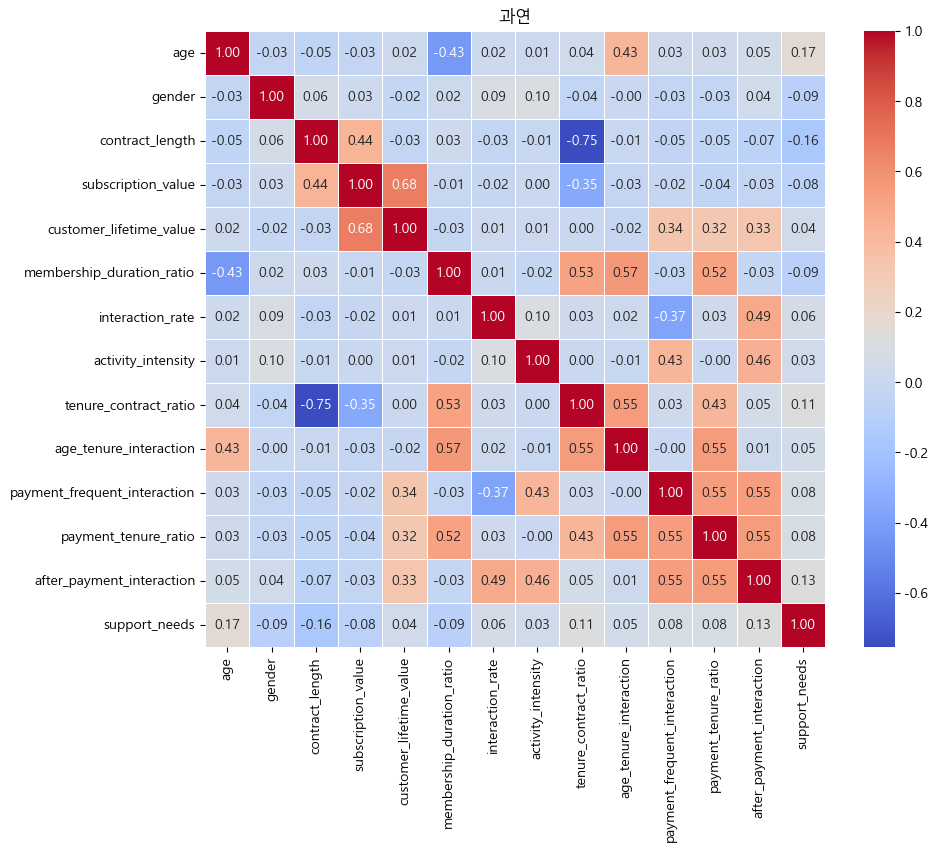

In [143]:
correlation_matrixx = train_fe.corr(method='spearman')

plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrixx,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=.5
)
plt.title('과연')
plt.show

# XGC로 모델링 할거기때문에 scailing 진행하지 않음
# 트리 기반 모델이니까 정규성 신경쓰지 않아도 됨

###  알고리즘의 선택 기준
머신러닝 알고리즘을 선택할 때는 데이터의 특성과 목표에 따라 가장 적합한 모델을 선택하는 것이 중요해요. 네 가지 알고리즘(SVM, Decision Tree, Random Forest, Gradient Boosting)은 각기 다른 강점과 특성을 가지고 있어서 상황에 맞게 활용할 수 있어요. 아래는 주요 선택 기준입니다.

 

SVM (Support Vector Machine)은 고차원 데이터와 샘플 크기가 적은 상황에서 적합한 알고리즘이에요. 고차원 데이터를 효과적으로 처리하며, 커널 기법을 통해 비선형 문제도 해결할 수 있는 유연성을 가지고 있습니다. 특히 텍스트 분류나 이미지 분류와 같은 이진 분류 문제에서 강력한 성능을 발휘합니다. 하지만 데이터 샘플이 많거나 Feature 수가 지나치게 많아지면 학습 속도가 느려지고, 하이퍼파라미터(C와 커널 유형) 튜닝에 민감하다는 점은 한계로 작용할 수 있어요.

 

Decision Tree는 단순하고 해석 가능한 모델이 필요한 경우에 적합합니다. 트리 구조 덕분에 데이터를 빠르게 분석하고, 시각화하여 직관적으로 이해할 수 있는 점이 큰 장점이에요. 분류와 회귀 문제 모두에서 활용 가능하며, 데이터 전처리가 부족하거나 결측값이 포함된 데이터에서도 잘 작동합니다. 그러나 단독으로 사용할 경우 트리가 너무 깊어질 수 있어 과적합 위험이 있고, 성능이 제한적이라는 점을 염두에 두어야 합니다.

 

Random Forest는 안정적이고 정확한 결과를 원할 때 선택하기 좋은 알고리즘이에요. 여러 Decision Tree를 결합해 노이즈와 복잡한 데이터에 강하며, 과적합을 방지하면서도 높은 정확도를 제공합니다. 또한 결측값이 있거나 Feature가 많은 데이터에서도 잘 작동합니다. 다만, 여러 Tree를 조합하는 과정에서 학습 속도가 느리고, 모델이 내린 결정을 해석하기 어렵다는 단점이 있어요.

 

Gradient Boosting은 데이터가 복잡하거나 대규모 데이터셋에서 최고의 성능이 필요할 때 선택하기 적합합니다. 약한 학습기들을 순차적으로 학습하여 높은 예측 성능을 제공하며, 데이터의 복잡한 패턴을 잘 포착하는 강점을 가지고 있어요. 특히 머신러닝 대회(Kaggle 등)에서 자주 사용되는 모델로, 분류와 회귀 문제 모두에서 탁월한 성능을 발휘합니다. 하지만 학습 속도가 느리고, 과적합의 위험이 있으므로 적절한 하이퍼파라미터 튜닝이 필수적입니다.




n_estimators : 학습 모델의 수, 많아질수록 성능 향상의 가능성이 있으나, 속도가 느려짐

learning_rate : 학습률, 너무 크면 gradient 발산의 가능성이 있으며, 너무 작으면 학습이 느림

max_depth : 최대 탐색 깊이, 너무 크면 과적합의 가능성, 너무 작으면 학습 성능 저하

min_samples_split : 분할 종료 최소 샘플 수, 큰 수면 과적합을 막지만 학습 성능 저하 가능성

min_samples_leaf : leaf node가 되기 위한 최소 샘플 수, min_samples_split과 비슷한 용도

random_state : 특정 숫자로 고정 시에 실행 시마다 고정된 결과 반환

# 종속변수 weights 생각해야함, 클래스 불균형이 있으니까!
# 방법: 언더샘플링, 오버샘플링, 가중치
# 가중치를 줍시다

In [144]:
from sklearn.utils.class_weight import compute_class_weight
# 1. y_train에 있는 각 클래스의 고유값과 그 개수를 확인
y_train.value_counts()
classes_y_train = [0,1,2]
counts = [14297, 8297, 8297]
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
print("클래스 종류:", np.unique(y_train))
print("계산된 클래스별 가중치:", class_weights)


weights = np.zeros(len(y_train))
for i, cls in enumerate(np.unique(y_train)):
    weights[y_train == cls] = class_weights[i]

클래스 종류: [0 1 2]
계산된 클래스별 가중치: [0.71945163 1.2397252  1.2446757 ]


In [145]:
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import f1_score, make_scorer
import xgboost as xgb

# 클래스 불균형 고려: f1_macro, StratifiedKFold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scorer = make_scorer(f1_score, average='macro')

param_grid = {
    'max_depth': [1, 5],
    'n_estimators': [100, 1],
    'learning_rate': [0.01, 0.03]
}

grid_search = GridSearchCV(
    estimator=xgb.XGBClassifier(
        tree_method='gpu_hist',
        random_state=42,
        objective='multi:softmax',  # 3개라서
        num_class=3,
        subsample=0.9,
        colsample_bytree=0.8,
        reg_alpha=0.0,
        reg_lambda=1.0
    ),
    param_grid=param_grid,
    cv=cv,
    scoring=scorer,
    verbose=1,
    n_jobs=1
)

grid_search.fit(x_train, y_train, sample_weight=weights)
print("최적 하이퍼파라미터:", grid_search.best_params_)
print("최고 f1_macro:", grid_search.best_score_)

best_model = grid_search.best_estimator_
preds_tuned = best_model.predict(x_test)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
최적 하이퍼파라미터: {'learning_rate': 0.03, 'max_depth': 5, 'n_estimators': 100}
최고 f1_macro: 0.4924305031798992


In [146]:
preds_final = best_model.predict(x_test)

# 교차검증 OOF f1_macro도 출력
from sklearn.model_selection import cross_val_score
scores = cross_val_score(best_model, x_train, y_train, scoring='f1_macro', cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42))
print(f"CV f1_macro: {scores.mean():.4f} +/- {scores.std():.4f}")

CV f1_macro: 0.3947 +/- 0.0056


In [133]:
# 제출 파일 생성
submission = pd.read_csv(data_path/'sample_submission.csv')
submission['support_needs'] = preds_final
submission.to_csv('xgb_tuned_submission.csv', index=False)

print("XGBoost 최적 모델 예측 완료 및 제출 파일 생성!")

XGBoost 최적 모델 예측 완료 및 제출 파일 생성!
